In [59]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [60]:
from matplotlib import rc
rc('font', family='AppleGothic')
plt.rcParams['axes.unicode_minus'] = False

### 서울시 행정구별 어린이보호구역 위치 데이터 불러오기 및 EDA

In [61]:
seoul_district = ["강남구", "강동구", "강북구", "강서구", "관악구", "광진구",
                  "구로구", "금천구", "노원구", "도봉구", "동대문구", "동작구",
                  "마포구", "서대문구", "서초구", "성동구", "성북구", "송파구", 
                  "양천구", "영등포구", "용산구", "은평구", "종로구", "중구", 
                  "중랑구"]
print("서울시 행정구 : " , len(seoul_district), "개")

서울시 행정구 :  25 개


In [62]:
df_강남 = pd.read_csv("data/서울특별시_강남구_어린이보호구역_20210628_1624926398398_13352.csv", encoding='CP949')
df_강동 = pd.read_csv("data/서울특별시_강동구_어린이보호구역_20210825_1629868277855_14537.csv", encoding='CP949')
df_강북 = pd.read_csv("data/서울특별시_강북구_어린이보호구역_20210520_1621472399952_5924.csv", encoding='CP949')
df_강서 = pd.read_csv("data/서울특별시_강서구_어린이보호구역_20210817_1629185109202_12440.csv", encoding='CP949')
df_관악 = pd.read_csv("data/서울특별시_관악구_어린이보호구역_20210923_1632965366411_10214.csv", encoding='CP949')
df_광진 = pd.read_csv("data/서울특별시_광진구_어린이보호구역_20201223_1609308627730_12544.csv", encoding='CP949')
df_구로 = pd.read_csv("data/서울특별시_구로구_어린이보호구역_20210430_1619743519599_8047.csv", encoding='CP949')
df_금천 = pd.read_csv("data/서울특별시_금천구_어린이보호구역_20210309_1615273702237_6786.csv", encoding='CP949')
df_노원 = pd.read_csv("data/서울특별시_노원구_어린이보호구역_20210915_1631691481500_17763.csv", encoding='CP949')
df_도봉 = pd.read_csv("data/서울특별시_도봉구_어린이보호구역_20190905.csv", encoding='CP949')
df_동대문 = pd.read_csv("data/서울특별시_동대문구_어린이보호구역_20210215_1613377662023_12486.csv", encoding='CP949')
df_동작 = pd.read_csv("data/서울특별시_동작구_어린이보호구역_20210820_1629418457860_10637.csv", encoding='CP949')
df_마포 = pd.read_csv("data/서울특별시_마포구_어린이보호구역_20200519_1596780853944_8477.csv", encoding='CP949')
df_서대문 = pd.read_csv("data/서울특별시_서대문구_어린이보호구역_20210623_1624513124138_7345.csv", encoding='CP949')
df_서초 = pd.read_csv("data/서울특별시_서초구_어린이보호구역_20200701_1594889326567_11506.csv", encoding='CP949')
df_성동 = pd.read_csv("data/서울특별시_성동구_어린이보호구역_20210903_1630630398036_8614.csv", encoding='CP949')
df_성북 = pd.read_csv("data/서울특별시_성북구_어린이보호구역_20210909_1631180339181_17445.csv", encoding='CP949')
df_송파 = pd.read_csv("data/서울특별시_송파구_어린이보호구역_20200220.csv", encoding='CP949')
df_양천 = pd.read_csv("data/서울특별시_양천구_어린이보호구역_20210601_1624598796318_10853.csv", encoding='CP949')
df_영등포 = pd.read_csv("data/서울특별시_영등포구_어린이보호구역_20210610_1623997390663_10644.csv", encoding='CP949')
df_용산 = pd.read_csv("data/서울특별시_용산구_어린이보호구역_20210927_1632790288851_5163.csv", encoding='CP949')
df_은평 = pd.read_csv("data/서울특별시_은평구_어린이보호구역_20210401_1619675496261_9745.csv", encoding='CP949')
df_종로 = pd.read_csv("data/서울특별시_종로구_어린이보호구역_20200713_1594601448221_6213.csv", encoding='CP949')
df_중구 = pd.read_csv("data/서울특별시_중구_어린이보호구역_20210906_1630901852317_5279.csv", encoding='CP949')
df_중랑 = pd.read_csv("data/서울특별시_중랑구_어린이보호구역_20210928_1634085769203_6879.csv", encoding='CP949')

In [63]:
df_seoul = pd.concat([df_강남, df_강동, df_강북, df_강서, df_관악, df_광진,
                      df_구로, df_금천, df_노원, df_도봉, df_동대문, df_동작,
                      df_마포, df_서대문, df_서초, df_성동, df_성북, df_송파,
                      df_양천, df_영등포, df_용산, df_은평, df_종로, df_중구,
                      df_중랑])
df_seoul

,시설종류,대상시설명,소재지도로명주소,소재지지번주소,위도,경도,관리기관명,관할경찰서명,CCTV설치여부,CCTV설치대수,보호구역도로폭,데이터기준일자
0,유치원,돌샘유치원,서울특별시 강남구 개포로 516,NaN,37.489140,127.070870,서울특별시 강남구청,수서경찰서,Y,1.0,12.6,2021-06-28
1,유치원,신양유치원,서울특별시 강남구 선릉로10길 18-6,NaN,37.483431,127.061678,서울특별시 강남구청,수서경찰서,Y,2.0,6.0,2021-06-28
2,유치원,이화유치원,서울특별시 강남구 개포로109길 9,NaN,37.495751,127.075096,서울특별시 강남구청,수서경찰서,Y,2.0,15.0,2021-06-28
3,유치원,영동제일유치원,서울특별시 강남구 삼성로120길 28,NaN,37.517579,127.053437,서울특별시 강남구청,강남경찰서,Y,2.0,5.8,2021-06-28
4,유치원,소망유치원,서울특별시 강남구 광평로56길 11,NaN,37.487979,127.105631,서울특별시 강남구청,수서경찰서,Y,1.0,11.0,2021-06-28
...,...,...,...,...,...,...,...,...,...,...,...,...
37,유치원,묵현초등학교병설유치원,서울특별시 중랑구 동일로157길 75,서울특별시 중랑구 묵2동 242-55,37.609079,127.073615,서울특별시 중랑구청,중랑경찰서,Y,NaN,NaN,2021-09-28
38,초등학교,서울면목초등학교,서울특별시 중랑구 면목로 434,서울특별시 중랑구 면목본동 221,37.590697,127.087289,서울특별시 중랑구청,중랑경찰서,Y,NaN,NaN,2021-09-28
39,초등학교,서울동원초등학교,서울특별시 중랑구 송림길 114,서울특별시 중랑구 망우본동 216,37.604577,127.104491,서울특별시 중랑구청,중랑경찰서,Y,NaN,NaN,2021-09-28
40,초등학교,서울금성초등학교,서울특별시 중랑구 신내로 21길 55,서울특별시 중랑구 신내2동 651,37.615314,127.089859,서울특별시 중랑구청,중랑경찰서,Y,NaN,NaN,2021-09-28


In [64]:
df_seoul.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1659 entries, 0 to 41
Data columns (total 12 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   시설종류      1659 non-null   object 
 1   대상시설명     1659 non-null   object 
 2   소재지도로명주소  1658 non-null   object 
 3   소재지지번주소   1229 non-null   object 
 4   위도        1657 non-null   float64
 5   경도        1657 non-null   float64
 6   관리기관명     1659 non-null   object 
 7   관할경찰서명    1659 non-null   object 
 8   CCTV설치여부  1659 non-null   object 
 9   CCTV설치대수  1474 non-null   float64
 10  보호구역도로폭   1312 non-null   object 
 11  데이터기준일자   1659 non-null   object 
dtypes: float64(3), object(9)
memory usage: 168.5+ KB


In [65]:
# 위도, 경도에 NaN이 존재해 Folium을 통해 위,경도에 따른 지도 표시 때 오류 발생 -> 결측치 처리

df_seoul.isnull().sum()

시설종류          0
대상시설명         0
소재지도로명주소      1
소재지지번주소     430
위도            2
경도            2
관리기관명         0
관할경찰서명        0
CCTV설치여부      0
CCTV설치대수    185
보호구역도로폭     347
데이터기준일자       0
dtype: int64

### 위도/경도 결측치 처리 -> 구글맵 수치 적용

In [66]:
df_seoul[df_seoul['위도'].isnull()]

# 구글맵 값으로 대체 
# 우현유치원: [위도, 경도] = [37.55803153278584, 126.83849338511251]
# 신자초등학교: [위도, 경도] = [37.530570141686226, 127.07532061631987]
# 신자초등학교 병설유치원: [위도, 경도] = [37.531012570506334, 127.07536353166357]

,시설종류,대상시설명,소재지도로명주소,소재지지번주소,위도,경도,관리기관명,관할경찰서명,CCTV설치여부,CCTV설치대수,보호구역도로폭,데이터기준일자
71,유치원,우현유치원,서울특별시 강서구 강서로 348 상가 2동 201호(우장산동),NaN,NaN,NaN,서울특별시 강서구청,강서경찰서,N,NaN,10.0,2021-08-17
4,초등학교,신자초등학교,서울특별시 광진구 자양동 뚝섬로46길 64,서울특별시 광진구 자양2동 591,NaN,127.073328,서울특별시청,광진경찰서,Y,7.0,NaN,2020-12-23


In [67]:
df_seoul[df_seoul['경도'].isnull()]

,시설종류,대상시설명,소재지도로명주소,소재지지번주소,위도,경도,관리기관명,관할경찰서명,CCTV설치여부,CCTV설치대수,보호구역도로폭,데이터기준일자
71,유치원,우현유치원,서울특별시 강서구 강서로 348 상가 2동 201호(우장산동),NaN,NaN,NaN,서울특별시 강서구청,강서경찰서,N,NaN,10.0,2021-08-17
43,유치원,신자병설유치원,서울특별시 광진구 자양동 뚝섬로46길 64,서울특별시 광진구 자양2동 591,37.530017,NaN,서울특별시청,광진경찰서,Y,1.0,NaN,2020-12-23


In [68]:
df_강서.isnull().sum()

시설종류         0
대상시설명        0
소재지도로명주소     0
소재지지번주소     87
위도           1
경도           1
관리기관명        0
관할경찰서명       0
CCTV설치여부     0
CCTV설치대수    33
보호구역도로폭     22
데이터기준일자      0
dtype: int64

In [69]:
display(df_강서[df_강서['위도'].isnull()])

display(df_강서[df_강서['경도'].isnull()])

# 서울특별시 강서구 강서구 348 (내발산동, 우장산힐스테이트)
# [위도, 경도] =. 37.55750, 126.83817

,시설종류,대상시설명,소재지도로명주소,소재지지번주소,위도,경도,관리기관명,관할경찰서명,CCTV설치여부,CCTV설치대수,보호구역도로폭,데이터기준일자
71,유치원,우현유치원,서울특별시 강서구 강서로 348 상가 2동 201호(우장산동),NaN,NaN,NaN,서울특별시 강서구청,강서경찰서,N,NaN,10.0,2021-08-17


,시설종류,대상시설명,소재지도로명주소,소재지지번주소,위도,경도,관리기관명,관할경찰서명,CCTV설치여부,CCTV설치대수,보호구역도로폭,데이터기준일자
71,유치원,우현유치원,서울특별시 강서구 강서로 348 상가 2동 201호(우장산동),NaN,NaN,NaN,서울특별시 강서구청,강서경찰서,N,NaN,10.0,2021-08-17


In [70]:
df_강서.loc[71, '위도'] = 37.55750
df_강서.loc[71, '경도'] = 126.83817

df_강서

,시설종류,대상시설명,소재지도로명주소,소재지지번주소,위도,경도,관리기관명,관할경찰서명,CCTV설치여부,CCTV설치대수,보호구역도로폭,데이터기준일자
0,초등학교,가곡초등학교,서울특별시 강서구 공항대로36길 74 (내발산동),NaN,37.555708,126.836102,서울특별시 강서구청,강서경찰서,Y,1.0,4.0,2021-08-17
1,초등학교,발산초등학교,서울특별시 강서구 강서로45길 113 (내발산동),NaN,37.550262,126.830994,서울특별시 강서구청,강서경찰서,Y,2.0,10.0,2021-08-17
2,초등학교,방화초등학교,서울특별시 강서구 양천로6길 92 (방화동),NaN,37.568704,126.807499,서울특별시 강서구청,강서경찰서,Y,1.0,10.0,2021-08-17
3,초등학교,백석초등학교,서울특별시 강서구 공항대로 491 (등촌동),NaN,37.553647,126.862425,서울특별시 강서구청,강서경찰서,Y,1.0,6.0,2021-08-17
4,초등학교,삼정초등학교,서울특별시 강서구 금낭화로 222 (방화동),NaN,37.580508,126.810494,서울특별시 강서구청,강서경찰서,Y,1.0,18.0,2021-08-17
...,...,...,...,...,...,...,...,...,...,...,...,...
83,어린이집,성산어린이집,서울특별시 강서구 개화동로23길 111(방화동),NaN,37.565298,126.811427,서울특별시 강서구청,강서경찰서,N,NaN,10.0,2021-08-17
84,어린이집,구립엠밸리큰나무어린이집,서울특별시 강서구 마곡중앙8로1길 10(가양동),NaN,37.561862,126.836076,서울특별시 강서구청,강서경찰서,N,NaN,12.0,2021-08-17
85,어린이집,하늘숲어린이집,서울특별시 강서구 강서로45다길 102(화곡동),NaN,37.543369,126.834408,서울특별시 강서구청,강서경찰서,N,NaN,4.0,2021-08-17
86,학원,스터디플랜독서실,서울특별시 강서구 곰달래로49길 80(화곡동),NaN,37.534937,126.856235,서울특별시 강서구청,강서경찰서,N,NaN,6.0,2021-08-17


In [71]:
df_강서.isnull().sum()

시설종류         0
대상시설명        0
소재지도로명주소     0
소재지지번주소     87
위도           0
경도           0
관리기관명        0
관할경찰서명       0
CCTV설치여부     0
CCTV설치대수    33
보호구역도로폭     22
데이터기준일자      0
dtype: int64

In [72]:
df_광진.isnull().sum()

시설종류         0
대상시설명        0
소재지도로명주소     0
소재지지번주소      0
위도           1
경도           1
관리기관명        0
관할경찰서명       0
CCTV설치여부     0
CCTV설치대수     0
보호구역도로폭     77
데이터기준일자      0
dtype: int64

In [73]:
display(df_광진[df_광진['위도'].isnull()])

display(df_광진[df_광진['경도'].isnull()])

,시설종류,대상시설명,소재지도로명주소,소재지지번주소,위도,경도,관리기관명,관할경찰서명,CCTV설치여부,CCTV설치대수,보호구역도로폭,데이터기준일자
4,초등학교,신자초등학교,서울특별시 광진구 자양동 뚝섬로46길 64,서울특별시 광진구 자양2동 591,NaN,127.073328,서울특별시청,광진경찰서,Y,7,NaN,2020-12-23


,시설종류,대상시설명,소재지도로명주소,소재지지번주소,위도,경도,관리기관명,관할경찰서명,CCTV설치여부,CCTV설치대수,보호구역도로폭,데이터기준일자
43,유치원,신자병설유치원,서울특별시 광진구 자양동 뚝섬로46길 64,서울특별시 광진구 자양2동 591,37.530017,NaN,서울특별시청,광진경찰서,Y,1,NaN,2020-12-23


In [74]:
df_광진.loc[4, '위도'] = 37.530570
df_광진.loc[43, '경도'] = 127.075321

df_광진

,시설종류,대상시설명,소재지도로명주소,소재지지번주소,위도,경도,관리기관명,관할경찰서명,CCTV설치여부,CCTV설치대수,보호구역도로폭,데이터기준일자
0,초등학교,광장초등학교,서울특별시 광진구 광장로1길 27,서울특별시 광진구 광장동 389-1,37.548549,127.101800,서울특별시청,광진경찰서,Y,5,NaN,2020-12-23
1,초등학교,구의초등학교,서울특별시 광진구 광나루로30길 49,서울특별시 광진구 화양동 303-9,37.543007,127.080312,서울특별시청,광진경찰서,Y,7,NaN,2020-12-23
2,초등학교,동의초등학교,서울특별시 광진구 영화사로 111,서울특별시 광진구 구의2동 4-5,37.553422,127.099047,서울특별시청,광진경찰서,Y,7,NaN,2020-12-23
3,초등학교,동자초등학교,서울특별시 광진구 뚝섬로 561,서울특별시 광진구 자양3동 518-1,37.535058,127.072179,서울특별시청,광진경찰서,Y,3,NaN,2020-12-23
4,초등학교,신자초등학교,서울특별시 광진구 자양동 뚝섬로46길 64,서울특별시 광진구 자양2동 591,37.530570,127.073328,서울특별시청,광진경찰서,Y,7,NaN,2020-12-23
...,...,...,...,...,...,...,...,...,...,...,...,...
72,외국인학교,한국켄트외국인학교,서울특별시 광진구 자양로35길 13(구의동),서울특별시 광진구 구의동 619-30,37.547163,127.086340,서울특별시청,광진경찰서,Y,4,NaN,2020-12-23
73,어린이집,아이터어린이집,서울특별시 광진구 자양로23길 79(구의동),서울특별시 광진구 구의동 634-13,37.543849,127.083776,서울특별시청,광진경찰서,Y,1,NaN,2020-12-23
74,어린이집,능동꿈맞이어린이집,서울특별시 광진구 천호대로120길 32,서울특별시 광진구 능동 249-4번지 광진구 서울특별시 KR,37.552830,127.085914,서울특별시청,광진경찰서,N,0,NaN,2020-12-23
75,외국인학교,재한몽골학교,서울특별시 광진구 광장동 광장로 1가길 13-10,서울특별시 광진구 광장동 401-17,37.545515,127.098237,서울특별시청,광진경찰서,N,0,NaN,2020-12-23


In [75]:
df_광진.isnull().sum()

시설종류         0
대상시설명        0
소재지도로명주소     0
소재지지번주소      0
위도           0
경도           0
관리기관명        0
관할경찰서명       0
CCTV설치여부     0
CCTV설치대수     0
보호구역도로폭     77
데이터기준일자      0
dtype: int64

#### 각 행정구별 csv 파일 컬럼 종류 동일

In [76]:
print(df_강남.columns, '\n')
print(df_강동.columns, '\n')
print(df_강북.columns, '\n')
print(df_강서.columns, '\n')
print(df_관악.columns, '\n')
print(df_광진.columns, '\n')
print(df_구로.columns, '\n')
print(df_금천.columns, '\n')
print(df_노원.columns, '\n')
print(df_도봉.columns, '\n')
print(df_동대문.columns, '\n')
print(df_동작.columns, '\n')
print(df_마포.columns, '\n')
print(df_서대문.columns, '\n')
print(df_서초.columns, '\n')
print(df_성동.columns, '\n')
print(df_성북.columns, '\n')
print(df_송파.columns, '\n')
print(df_양천.columns, '\n')
print(df_영등포.columns, '\n')
print(df_용산.columns, '\n')
print(df_은평.columns, '\n')
print(df_종로.columns, '\n')
print(df_중구.columns, '\n')
print(df_중랑.columns, '\n')

Index(['시설종류', '대상시설명', '소재지도로명주소', '소재지지번주소', '위도', '경도', '관리기관명', '관할경찰서명',
       'CCTV설치여부', 'CCTV설치대수', '보호구역도로폭', '데이터기준일자'],
      dtype='object') 

Index(['시설종류', '대상시설명', '소재지도로명주소', '소재지지번주소', '위도', '경도', '관리기관명', '관할경찰서명',
       'CCTV설치여부', 'CCTV설치대수', '보호구역도로폭', '데이터기준일자'],
      dtype='object') 

Index(['시설종류', '대상시설명', '소재지도로명주소', '소재지지번주소', '위도', '경도', '관리기관명', '관할경찰서명',
       'CCTV설치여부', 'CCTV설치대수', '보호구역도로폭', '데이터기준일자'],
      dtype='object') 

Index(['시설종류', '대상시설명', '소재지도로명주소', '소재지지번주소', '위도', '경도', '관리기관명', '관할경찰서명',
       'CCTV설치여부', 'CCTV설치대수', '보호구역도로폭', '데이터기준일자'],
      dtype='object') 

Index(['시설종류', '대상시설명', '소재지도로명주소', '소재지지번주소', '위도', '경도', '관리기관명', '관할경찰서명',
       'CCTV설치여부', 'CCTV설치대수', '보호구역도로폭', '데이터기준일자'],
      dtype='object') 

Index(['시설종류', '대상시설명', '소재지도로명주소', '소재지지번주소', '위도', '경도', '관리기관명', '관할경찰서명',
       'CCTV설치여부', 'CCTV설치대수', '보호구역도로폭', '데이터기준일자'],
      dtype='object') 

Index(['시설종류', '대상시설명', '소재지도로명주소', '소재지지번주소', '위도', '경도', '관리기관

### 각 행정구별 데이터 프레임 1열에 "행정구" 컬럼 추가

In [77]:
df_강남.insert(0, '행정구', '강남구')
df_강동.insert(0, '행정구', '강동구')
df_강북.insert(0, '행정구', '강북구')
df_강서.insert(0, '행정구', '강서구')
df_관악.insert(0, '행정구', '관악구')
df_광진.insert(0, '행정구', '광진구')
df_구로.insert(0, '행정구', '구로구')
df_금천.insert(0, '행정구', '금천구')
df_노원.insert(0, '행정구', '노원구')
df_도봉.insert(0, '행정구', '도봉구')
df_동대문.insert(0, '행정구', '동대문구')
df_동작.insert(0, '행정구', '동작구')
df_마포.insert(0, '행정구', '마포구')
df_서대문.insert(0, '행정구', '서대문구')
df_서초.insert(0, '행정구', '서초구')
df_성동.insert(0, '행정구', '성동구')
df_성북.insert(0, '행정구', '성북구')
df_송파.insert(0, '행정구', '송파구')
df_양천.insert(0, '행정구', '양천구')
df_영등포.insert(0, '행정구', '영등포구')
df_용산.insert(0, '행정구', '용산구')
df_은평.insert(0, '행정구', '은평구')
df_종로.insert(0, '행정구', '종로구')
df_중구.insert(0, '행정구', '중구')
df_중랑.insert(0, '행정구', '중랑구')

In [78]:
df_강남

,행정구,시설종류,대상시설명,소재지도로명주소,소재지지번주소,위도,경도,관리기관명,관할경찰서명,CCTV설치여부,CCTV설치대수,보호구역도로폭,데이터기준일자
0,강남구,유치원,돌샘유치원,서울특별시 강남구 개포로 516,NaN,37.489140,127.070870,서울특별시 강남구청,수서경찰서,Y,1,12.6,2021-06-28
1,강남구,유치원,신양유치원,서울특별시 강남구 선릉로10길 18-6,NaN,37.483431,127.061678,서울특별시 강남구청,수서경찰서,Y,2,6.0,2021-06-28
2,강남구,유치원,이화유치원,서울특별시 강남구 개포로109길 9,NaN,37.495751,127.075096,서울특별시 강남구청,수서경찰서,Y,2,15.0,2021-06-28
3,강남구,유치원,영동제일유치원,서울특별시 강남구 삼성로120길 28,NaN,37.517579,127.053437,서울특별시 강남구청,강남경찰서,Y,2,5.8,2021-06-28
4,강남구,유치원,소망유치원,서울특별시 강남구 광평로56길 11,NaN,37.487979,127.105631,서울특별시 강남구청,수서경찰서,Y,1,11.0,2021-06-28
...,...,...,...,...,...,...,...,...,...,...,...,...,...
96,강남구,어린이집,한울어린이집,서울특별시 강남구 삼성로51길 25,NaN,37.495907,127.061000,서울특별시 강남구청,수서경찰서,Y,1,8.0,2021-06-28
97,강남구,어린이집,미담어린이집,서울특별시 강남구 일원로 115,NaN,37.484021,127.084460,서울특별시 강남구청,수서경찰서,Y,1,8.0,2021-06-28
98,강남구,어린이집,아이앤어린이집,서울특별시 강남구 봉은사로68길 35-2,NaN,37.510028,127.051843,서울특별시 강남구청,강남경찰서,Y,1,8.0,2021-06-28
99,강남구,어린이집,보람어린이집,서울특별시 강남구 남부순환로397길 19,NaN,37.494385,127.061340,서울특별시 강남구청,수서경찰서,Y,10,14.0,2021-06-28


In [80]:
df_seoul = pd.concat([df_강남, df_강동, df_강북, df_강서, df_관악, df_광진,
                      df_구로, df_금천, df_노원, df_도봉, df_동대문, df_동작,
                      df_마포, df_서대문, df_서초, df_성동, df_성북, df_송파,
                      df_양천, df_영등포, df_용산, df_은평, df_종로, df_중구,
                      df_중랑])
df_seoul

,행정구,시설종류,대상시설명,소재지도로명주소,소재지지번주소,위도,경도,관리기관명,관할경찰서명,CCTV설치여부,CCTV설치대수,보호구역도로폭,데이터기준일자
0,강남구,유치원,돌샘유치원,서울특별시 강남구 개포로 516,NaN,37.489140,127.070870,서울특별시 강남구청,수서경찰서,Y,1.0,12.6,2021-06-28
1,강남구,유치원,신양유치원,서울특별시 강남구 선릉로10길 18-6,NaN,37.483431,127.061678,서울특별시 강남구청,수서경찰서,Y,2.0,6.0,2021-06-28
2,강남구,유치원,이화유치원,서울특별시 강남구 개포로109길 9,NaN,37.495751,127.075096,서울특별시 강남구청,수서경찰서,Y,2.0,15.0,2021-06-28
3,강남구,유치원,영동제일유치원,서울특별시 강남구 삼성로120길 28,NaN,37.517579,127.053437,서울특별시 강남구청,강남경찰서,Y,2.0,5.8,2021-06-28
4,강남구,유치원,소망유치원,서울특별시 강남구 광평로56길 11,NaN,37.487979,127.105631,서울특별시 강남구청,수서경찰서,Y,1.0,11.0,2021-06-28
...,...,...,...,...,...,...,...,...,...,...,...,...,...
37,중랑구,유치원,묵현초등학교병설유치원,서울특별시 중랑구 동일로157길 75,서울특별시 중랑구 묵2동 242-55,37.609079,127.073615,서울특별시 중랑구청,중랑경찰서,Y,NaN,NaN,2021-09-28
38,중랑구,초등학교,서울면목초등학교,서울특별시 중랑구 면목로 434,서울특별시 중랑구 면목본동 221,37.590697,127.087289,서울특별시 중랑구청,중랑경찰서,Y,NaN,NaN,2021-09-28
39,중랑구,초등학교,서울동원초등학교,서울특별시 중랑구 송림길 114,서울특별시 중랑구 망우본동 216,37.604577,127.104491,서울특별시 중랑구청,중랑경찰서,Y,NaN,NaN,2021-09-28
40,중랑구,초등학교,서울금성초등학교,서울특별시 중랑구 신내로 21길 55,서울특별시 중랑구 신내2동 651,37.615314,127.089859,서울특별시 중랑구청,중랑경찰서,Y,NaN,NaN,2021-09-28


In [81]:
df_seoul.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1659 entries, 0 to 41
Data columns (total 13 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   행정구       1659 non-null   object 
 1   시설종류      1659 non-null   object 
 2   대상시설명     1659 non-null   object 
 3   소재지도로명주소  1658 non-null   object 
 4   소재지지번주소   1229 non-null   object 
 5   위도        1659 non-null   float64
 6   경도        1659 non-null   float64
 7   관리기관명     1659 non-null   object 
 8   관할경찰서명    1659 non-null   object 
 9   CCTV설치여부  1659 non-null   object 
 10  CCTV설치대수  1474 non-null   float64
 11  보호구역도로폭   1312 non-null   object 
 12  데이터기준일자   1659 non-null   object 
dtypes: float64(3), object(10)
memory usage: 181.5+ KB


In [82]:
df_seoul.isnull().sum()

행정구           0
시설종류          0
대상시설명         0
소재지도로명주소      1
소재지지번주소     430
위도            0
경도            0
관리기관명         0
관할경찰서명        0
CCTV설치여부      0
CCTV설치대수    185
보호구역도로폭     347
데이터기준일자       0
dtype: int64

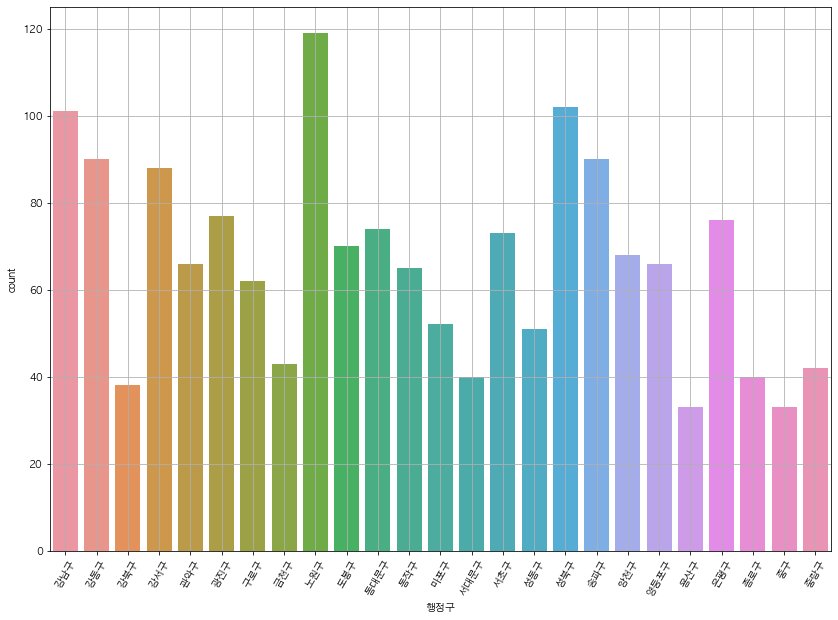

In [83]:
plt.figure(figsize=(14,10))
sns.countplot(data=df_seoul, x='행정구')
plt.xticks(rotation = 60)
plt.grid()

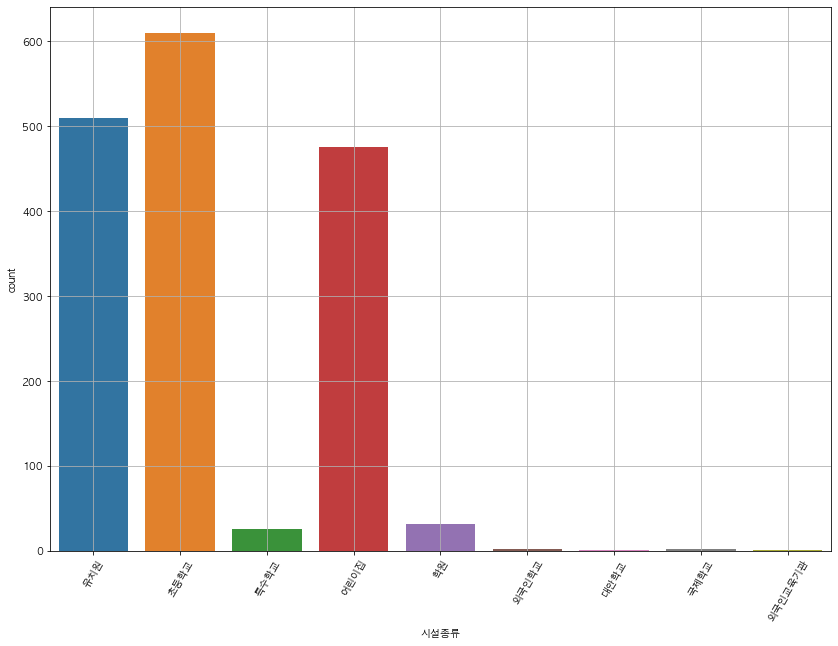

In [84]:
plt.figure(figsize=(14,10))
sns.countplot(data=df_seoul, x='시설종류')
plt.xticks(rotation = 60)
plt.grid()

In [67]:
# df_seoul[df_seoul['대상시설명'] == '신자초등학교']['위도'] = 37.530570
# df_seoul[df_seoul['대상시설명'] == '신자초등학교']['경도'] = 127.075321
df_seoul[df_seoul['대상시설명'] == '신자초등학교'][['위도', '경도']] = [37.530570, 127.075321]

<ipython-input-67-918d157e653a>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_seoul[df_seoul['대상시설명'] == '신자초등학교'][['위도', '경도']] = [37.530570, 127.075321]


In [60]:
seoul_protect = df_seoul.copy()
seoul_protect

,시설종류,대상시설명,소재지도로명주소,소재지지번주소,위도,경도,관리기관명,관할경찰서명,CCTV설치여부,CCTV설치대수,보호구역도로폭,데이터기준일자
0,유치원,돌샘유치원,서울특별시 강남구 개포로 516,NaN,37.489140,127.070870,서울특별시 강남구청,수서경찰서,Y,1.0,12.6,2021-06-28
1,유치원,신양유치원,서울특별시 강남구 선릉로10길 18-6,NaN,37.483431,127.061678,서울특별시 강남구청,수서경찰서,Y,2.0,6.0,2021-06-28
2,유치원,이화유치원,서울특별시 강남구 개포로109길 9,NaN,37.495751,127.075096,서울특별시 강남구청,수서경찰서,Y,2.0,15.0,2021-06-28
3,유치원,영동제일유치원,서울특별시 강남구 삼성로120길 28,NaN,37.517579,127.053437,서울특별시 강남구청,강남경찰서,Y,2.0,5.8,2021-06-28
4,유치원,소망유치원,서울특별시 강남구 광평로56길 11,NaN,37.487979,127.105631,서울특별시 강남구청,수서경찰서,Y,1.0,11.0,2021-06-28
...,...,...,...,...,...,...,...,...,...,...,...,...
37,유치원,묵현초등학교병설유치원,서울특별시 중랑구 동일로157길 75,서울특별시 중랑구 묵2동 242-55,37.609079,127.073615,서울특별시 중랑구청,중랑경찰서,Y,NaN,NaN,2021-09-28
38,초등학교,서울면목초등학교,서울특별시 중랑구 면목로 434,서울특별시 중랑구 면목본동 221,37.590697,127.087289,서울특별시 중랑구청,중랑경찰서,Y,NaN,NaN,2021-09-28
39,초등학교,서울동원초등학교,서울특별시 중랑구 송림길 114,서울특별시 중랑구 망우본동 216,37.604577,127.104491,서울특별시 중랑구청,중랑경찰서,Y,NaN,NaN,2021-09-28
40,초등학교,서울금성초등학교,서울특별시 중랑구 신내로 21길 55,서울특별시 중랑구 신내2동 651,37.615314,127.089859,서울특별시 중랑구청,중랑경찰서,Y,NaN,NaN,2021-09-28


In [96]:
index_range = [i for i in range(0, 1659)]
index_range
print('전체 인덱스 수 : ', len(index_range))

전체 인덱스 수 :  1659


In [97]:
df_seoul = df_seoul.set_index(keys=[index_range])
df_seoul

,행정구,시설종류,대상시설명,소재지도로명주소,소재지지번주소,위도,경도,관리기관명,관할경찰서명,CCTV설치여부,CCTV설치대수,보호구역도로폭,데이터기준일자
0,강남구,유치원,돌샘유치원,서울특별시 강남구 개포로 516,NaN,37.489140,127.070870,서울특별시 강남구청,수서경찰서,Y,1.0,12.6,2021-06-28
1,강남구,유치원,신양유치원,서울특별시 강남구 선릉로10길 18-6,NaN,37.483431,127.061678,서울특별시 강남구청,수서경찰서,Y,2.0,6.0,2021-06-28
2,강남구,유치원,이화유치원,서울특별시 강남구 개포로109길 9,NaN,37.495751,127.075096,서울특별시 강남구청,수서경찰서,Y,2.0,15.0,2021-06-28
3,강남구,유치원,영동제일유치원,서울특별시 강남구 삼성로120길 28,NaN,37.517579,127.053437,서울특별시 강남구청,강남경찰서,Y,2.0,5.8,2021-06-28
4,강남구,유치원,소망유치원,서울특별시 강남구 광평로56길 11,NaN,37.487979,127.105631,서울특별시 강남구청,수서경찰서,Y,1.0,11.0,2021-06-28
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1654,중랑구,유치원,묵현초등학교병설유치원,서울특별시 중랑구 동일로157길 75,서울특별시 중랑구 묵2동 242-55,37.609079,127.073615,서울특별시 중랑구청,중랑경찰서,Y,NaN,NaN,2021-09-28
1655,중랑구,초등학교,서울면목초등학교,서울특별시 중랑구 면목로 434,서울특별시 중랑구 면목본동 221,37.590697,127.087289,서울특별시 중랑구청,중랑경찰서,Y,NaN,NaN,2021-09-28
1656,중랑구,초등학교,서울동원초등학교,서울특별시 중랑구 송림길 114,서울특별시 중랑구 망우본동 216,37.604577,127.104491,서울특별시 중랑구청,중랑경찰서,Y,NaN,NaN,2021-09-28
1657,중랑구,초등학교,서울금성초등학교,서울특별시 중랑구 신내로 21길 55,서울특별시 중랑구 신내2동 651,37.615314,127.089859,서울특별시 중랑구청,중랑경찰서,Y,NaN,NaN,2021-09-28


In [61]:
seoul_protect[seoul_protect['대상시설명'] == '신자초등학교']['경도'] = 127.075321
seoul_protect[seoul_protect['대상시설명'] == '신자초등학교']

<ipython-input-61-32ba7ef50e0f>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  seoul_protect[seoul_protect['대상시설명'] == '신자초등학교']['경도'] = 127.075321


,시설종류,대상시설명,소재지도로명주소,소재지지번주소,위도,경도,관리기관명,관할경찰서명,CCTV설치여부,CCTV설치대수,보호구역도로폭,데이터기준일자
4,초등학교,신자초등학교,서울특별시 광진구 자양동 뚝섬로46길 64,서울특별시 광진구 자양2동 591,NaN,127.073328,서울특별시청,광진경찰서,Y,7.0,NaN,2020-12-23


In [ ]:
# 위도/경도 결측값 2개 어떻게 처리? 
# 직접 찾아서 메꾸기 
# 평균값으로 대체

# df_seoul['위도'].fillna()
# df_seoul['위도'].fillna()

In [86]:
import folium

In [87]:
map = folium.Map(location = [37.566664, 126.978413], zoom_start = 11)
map

In [98]:
df_seoul[['위도', '경도']]

,위도,경도
0,37.489140,127.070870
1,37.483431,127.061678
2,37.495751,127.075096
3,37.517579,127.053437
4,37.487979,127.105631
...,...,...
1654,37.609079,127.073615
1655,37.590697,127.087289
1656,37.604577,127.104491
1657,37.615314,127.089859


In [103]:
seoul_protect = df_seoul[['소재지도로명주소', '시설종류', '위도', '경도']]

for i in seoul_protect.index:
    latitude = seoul_protect.loc[i, '위도']
    longtitude = seoul_protect.loc[i, '경도']
    tooltip = '어린이 보호구역'
    folium.Marker([latitude, longtitude], tooltip = tooltip).add_to(map)
    
map

In [104]:
from folium.plugins import MarkerCluster

map = folium.Map(location = [37.566664, 126.978413], zoom_start = 11)

list1 = []
list2 = []

marker_cluster = MarkerCluster().add_to(map)

for i in seoul_protect.index:
    folium.Marker(location = [seoul_protect.loc[i, '위도'], seoul_protect.loc[i, '경도']],
                  zoom_start = 11,
                  popup = seoul_protect.loc[i, '시설종류']).add_to(marker_cluster)
    
    list1.append(seoul_protect.loc[i, '위도'])
    list2.append(seoul_protect.loc[i, '경도'])

map

In [107]:
df_bus_stop = pd.read_csv('data/서울시버스정류소좌표데이터(2021.01.14.).csv', encoding='CP949')
df_bus_stop

# 정류장 위치의 X좌표는 -> 경도, Y좌표는 -> 위도를 나타낸다고 할 수 있음(근사)

,표준ID,ARS-ID,정류소명,X좌표,Y좌표
0,100000001,1001,종로2가사거리,126.987786,37.569764
1,100000002,1002,창경궁.서울대학교병원,126.996520,37.579179
2,100000003,1003,명륜3가.성대입구,126.998290,37.582709
3,100000004,1004,종로2가.삼일교,126.987507,37.568582
4,100000005,1005,혜화동로터리.여운형활동터,127.001694,37.586230
...,...,...,...,...,...
10916,124000334,25995,우성아파트,127.139326,37.550442
10917,124000333,25996,우성아파트,127.140052,37.550620
10918,124000332,25997,조일약국,127.123477,37.533686
10919,124000331,25998,성내시장,127.125410,37.536199


In [109]:
bus_stop = df_bus_stop[['정류소명', 'X좌표', 'Y좌표']]

bus_stop_map = folium.Map(location = [37.566664, 126.978413], zoom_start = 11)

list1 = []
list2 = []

marker_cluster = MarkerCluster().add_to(bus_stop_map)

for i in bus_stop.index:
    folium.Marker(location = [bus_stop.loc[i, 'Y좌표'], bus_stop.loc[i, 'X좌표']],
                  zoom_start = 11,
                  popup = bus_stop.loc[i, '정류소명']).add_to(marker_cluster)
    
    list1.append(bus_stop.loc[i, 'Y좌표'])
    list2.append(bus_stop.loc[i, 'X좌표'])

bus_stop_map

In [ ]:
# 각 행정구 내의 버스정류장 수 